# Details

Imagine that you are a data scientist confronted with this data. First after you clean the data within
python, your task is to advise government agencies about how to improve road safety and create a
model that would predict such accidents and the injuries that they incur.

- Are there significant hours of the day, and days of the week, on which accidents occur?
- For motorbikes, are there significant hours of the day, and days of the week, on which
accidents occur?
- For pedestrians involved in accidents, are there significant hours of the day, and days of the
week, on which they are more likely to be involved?
- What impact, if any, does daylight savings have on road traffic accidents in the week after it
starts and stops?
- What impact, if any, does sunrise and sunset times have on road traffic accidents?
- Are there particular types of vehicles (engine capacity, age of vehicle, etc.) that are more
frequently involved in road traffic accidents?
- Are there particular conditions (weather, geographic location, situations) that generate more
road traffic accidents?
- How does driver related variables affect the outcome (e.g., age of the driver, and the purpose
of the journey)?
- Can we make predictions about when and where accidents will occur, and the severity of the
injuries sustained from the data supplied to improve road safety? How well do our models
compare to government models?

We should apply some machine learning approaches such as: Apriori Algorithm,
clustering Algorithm, PCA, Decision trees etc……. especially for last part

# Importing Modules

In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Setting environment to ignore future warnings
import warnings
warnings.simplefilter('ignore')

# Changing default figure size
from matplotlib.pylab import rcParams
rcParams["figure.figsize"] = (14, 7)

# Changing default pandas operation
pd.set_option('max_columns', 70)
pd.set_option('max_rows', 70)

# Loading Data

In [10]:
# Loading Accident data
df_acc = pd.read_csv("Road Safety Data - Accidents 2019.csv")
display(df_acc.shape)
df_acc.head()

(117536, 32)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
0,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762
1,2019010152270,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,15/01/2019,3,21:45,9,E09000022,3,23,2,30,0,-1,-1,0,-1,-1,4,1,1,0,0,1,3,E01003117
2,2019010155191,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,01/01/2019,3,01:50,2,E09000007,4,504,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01000943
3,2019010155192,525531.0,184605.0,-0.191044,51.546387,1,2,1,1,01/01/2019,3,01:20,2,E09000007,4,510,6,20,3,4,4,510,0,0,4,1,1,0,0,1,1,E01000973
4,2019010155194,524920.0,184004.0,-0.200064,51.541121,1,3,2,2,01/01/2019,3,00:40,28,E09000005,3,4003,6,30,6,4,6,0,0,0,4,1,1,0,0,1,1,E01000546


In [11]:
# Loading Casualities data
df_cas = pd.read_csv("Road Safety Data - Casualties 2019.csv")
display(df_cas.shape)
df_cas.head()

(153158, 16)

,Accident_Index,Vehicle_Reference,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
0,2019010128300,1,1,1,1,58,9,3,0,0,0,0,0,9,1,2
1,2019010128300,1,2,2,2,-1,-1,3,0,0,1,0,0,9,1,5
2,2019010128300,1,3,2,2,-1,-1,3,0,0,2,0,0,9,1,5
3,2019010152270,1,1,1,2,24,5,3,0,0,0,0,0,9,1,3
4,2019010155191,2,1,2,2,21,5,3,0,0,0,0,0,1,1,1


In [12]:
# Loading Vehicles data
df_veh = pd.read_csv("Road Safety Data- Vehicles 2019.csv")
display(df_veh.shape)
df_veh.head()

(216381, 23)

,Accident_Index,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
0,2019010128300,1,9,0,-1,-1,-1,-1,-1,-1,-1,4,-1,6,1,58,9,-1,-1,-1,2,1,2
1,2019010128300,2,9,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,6,3,-1,-1,-1,-1,-1,2,1,2
2,2019010152270,1,9,0,18,-1,0,-1,-1,-1,-1,1,-1,6,2,24,5,-1,-1,-1,3,1,3
3,2019010152270,2,9,0,18,-1,0,-1,-1,-1,-1,-1,-1,6,3,-1,-1,-1,-1,-1,6,1,6
4,2019010155191,1,9,0,3,0,1,0,0,0,0,2,1,6,1,45,7,-1,-1,-1,4,1,4


# Data Preprocessing

In [13]:
# lets try to check the percentage of missing values,unique values,percentage of one catagory values and type against each column.
def statistics(df):
    stats = []
    for col in df.columns:
        stats.append((col, df[col].nunique(), df[col].isnull().sum(), df[col].isnull().sum() * 100 / df.shape[0], df[col].dtype))

    stats_df = pd.DataFrame(stats, columns=['Feature', 'Unique_values', 'Missing values', 'Percentage of Missing Values', 'Data Type'])
    stats_df.set_index('Feature', drop=True, inplace=True)
    stats_df.drop(stats_df[stats_df['Missing values'] == 0].index, axis=0, inplace=True)
    stats_df.sort_values('Percentage of Missing Values', ascending=False, inplace=True)
    return stats_df

statistics(df_acc)

,Unique_values,Missing values,Percentage of Missing Values,Data Type
Feature,,,,
LSOA_of_Accident_Location,27762,5714,4.861489,object
Time,1439,63,0.053601,object
Location_Easting_OSGR,93266,28,0.023822,float64
Location_Northing_OSGR,93874,28,0.023822,float64
Longitude,115009,28,0.023822,float64
Latitude,113563,28,0.023822,float64


We don't have much missing data so dropping NAN will not make much impact.

In [14]:
df_acc.dropna(inplace=True)

In [15]:
statistics(df_veh)

,Unique_values,Missing values,Percentage of Missing Values,Data Type
Feature,,,,


In [16]:
statistics(df_cas)

,Unique_values,Missing values,Percentage of Missing Values,Data Type
Feature,,,,


In [17]:
# Merging all datasets into one
temp = pd.merge(df_acc, df_veh, on="Accident_Index", how="inner")
df = pd.merge(temp, df_cas, on="Accident_Index", how="inner")
display(df.shape)
df.head()

(196121, 69)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Vehicle_Reference_x,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Vehicle_Reference_y,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
0,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762,1,9,0,-1,-1,-1,-1,-1,-1,-1,4,-1,6,1,58,9,-1,-1,-1,2,1,2,1,1,1,1,58,9,3,0,0,0,0,0,9,1,2
1,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762,1,9,0,-1,-1,-1,-1,-1,-1,-1,4,-1,6,1,58,9,-1,-1,-1,2,1,2,1,2,2,2,-1,-1,3,0,0,1,0,0,9,1,5
2,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762,1,9,0,-1,-1,-1,-1,-1,-1,-1,4,-1,6,1,58,9,-1,-1,-1,2,1,2,1,3,2,2,-1,-1,3,0,0,2,0,0,9,1,5
3,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762,2,9,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,6,3,-1,-1,-1,-1,-1,2,1,2,1,1,1,1,58,9,3,0,0,0,0,0,9,1,2
4,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762,2,9,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,6,3,-1,-1,-1,-1,-1,2,1,2,1,2,2,2,-1,-1,3,0,0,1,0,0,9,1,5


In [18]:
statistics(df)

,Unique_values,Missing values,Percentage of Missing Values,Data Type
Feature,,,,


In [19]:
# let's check the data types
df.dtypes

Accident_Index                                  object
Location_Easting_OSGR                          float64
Location_Northing_OSGR                         float64
Longitude                                      float64
Latitude                                       float64
Police_Force                                     int64
Accident_Severity                                int64
Number_of_Vehicles                               int64
Number_of_Casualties                             int64
Date                                            object
Day_of_Week                                      int64
Time                                            object
Local_Authority_(District)                       int64
Local_Authority_(Highway)                       object
1st_Road_Class                                   int64
1st_Road_Number                                  int64
Road_Type                                        int64
Speed_limit                                      int64
Junction_D

From this we can see that Data and Time feature has data type of Object that is not correct so let's make it correct.

In [20]:
# Function to convert the string into time
def convert_time(x):
    try:
        x = pd.to_datetime(x, format="%H:%M").time().hour
        return x
    except:
        pass

In [21]:
# Converting string into time
df['Hour'] = df.Time.apply(convert_time)

In [22]:
# Making a copy of data
data = df.copy()

# Performing Analysis

In [23]:
# Percentage on bar
def per_on_bar(feature, title="", limited=False, n=10, print_data=True):
    print("Total unique values are: ", len(feature.value_counts()), "\n\n")
    print("Category\tValue\n")
    if limited:
        data = feature.value_counts()[0:n]
    else:
        data = feature.value_counts()
    if print_data:
        print(data)
    categories_num = len(data)
    #plotting bar-plot and pie chart
    sns.set_style('darkgrid')
    plt.figure(figsize=(16,5))
    plt.title(title, fontsize=16)
    plt.xticks(rotation=45)
    plot = sns.barplot(x=data.index, y=data.values, edgecolor="black", palette=sns.palettes.color_palette("icefire"))
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.08
        y = p.get_y() + p.get_height()
        plot.annotate(percentage, (x, y), size = 12)
    plt.show()

In [24]:
def make_plots(feature, title="", limited=False, n=10):
    print("Total unique values are: ", len(feature.value_counts()), "\n\n")
    print("Category\tValue\n")
    if limited:
        data = feature.value_counts()[0:n]
    else:
        data = feature.value_counts()
    print(data)
    categories_num = len(data)
    #plotting bar-plot and pie chart
    sns.set_style('darkgrid')
    plt.figure(figsize=(16,5))
    plt.subplot(1,2,1)
    plt.title(title, fontsize=16)
    plt.xticks(rotation=45)
    plot = sns.barplot(x=data.index, y=data.values, edgecolor="white", palette=sns.palettes.color_palette("icefire"))
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.08
        y = p.get_y() + p.get_height()
        plot.annotate(percentage, (x, y), size = 12)
    
    plt.subplot(1,2,2)
    labels = data.index
    plt.pie(x=data, autopct="%.1f%%", explode=[0.02]*categories_num, labels=labels, pctdistance=0.5)
    plt.title(title, fontsize=16)
    plt.show()

In [25]:
def make_bar_plot(x, y, title, xlable=None, ylable=None):
    plt.figure(figsize=(15, 5))
    sns.barplot(x, y)
    plt.title(title, fontsize=18)
    plt.xlabel(xlable, fontsize=14)
    plt.ylabel(ylable, fontsize=14)
    plt.xticks(rotation=65)
    plt.show()

## a) Are there significant hours of the day, and days of the week, on which accidents occur?

Total unique values are:  7 


Category	Value

Friday       31966
Thursday     29321
Wednesday    29097
Tuesday      28498
Saturday     27100
Monday       26904
Sunday       23235
Name: Day_of_Week, dtype: int64


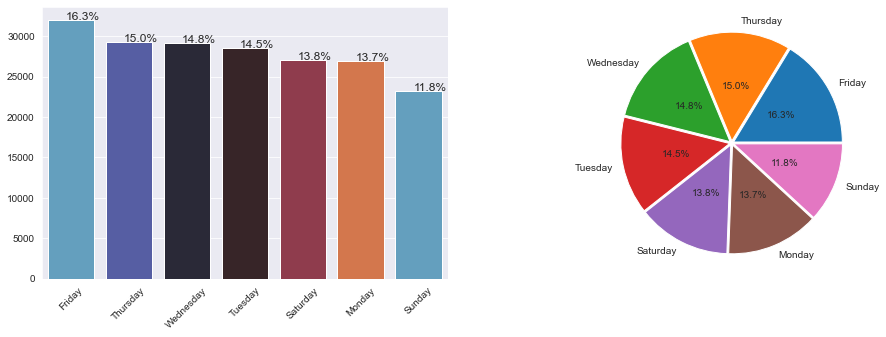

In [26]:
mapper = {2: "Monday", 3: "Tuesday", 4: "Wednesday", 5: "Thursday", 6: "Friday", 7: "Saturday", 1: "Sunday"}
make_plots(df.Day_of_Week.map(mapper))

Total unique values are:  24 


Category	Value



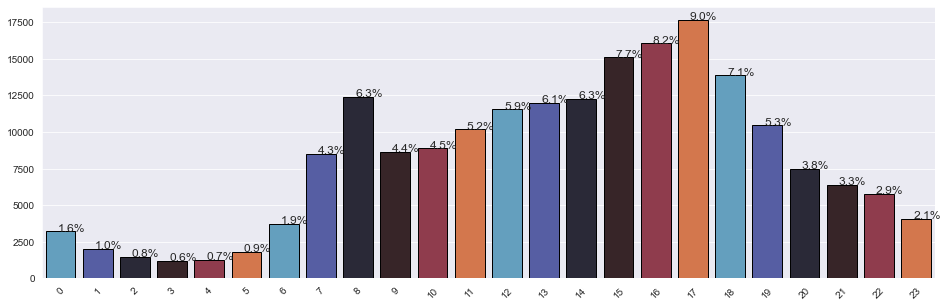

In [27]:
per_on_bar(df.Hour, print_data=False)

From the first graph we can see that the accidents are more on Friday than on any other day.

From the second graph we can see that the accidents are more in hour 8 and in hour 16 and 17.

## b)  For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur?

In [21]:
temp = df[((df.Vehicle_Type == 2) |(df.Vehicle_Type == 3) |(df.Vehicle_Type == 4) |(df.Vehicle_Type == 5) |(df.Vehicle_Type == 22) |(df.Vehicle_Type == 23))]

Total unique values are:  7 


Category	Value

Friday       2020
Wednesday    1893
Thursday     1849
Tuesday      1755
Saturday     1753
Sunday       1678
Monday       1611
Name: Day_of_Week, dtype: int64


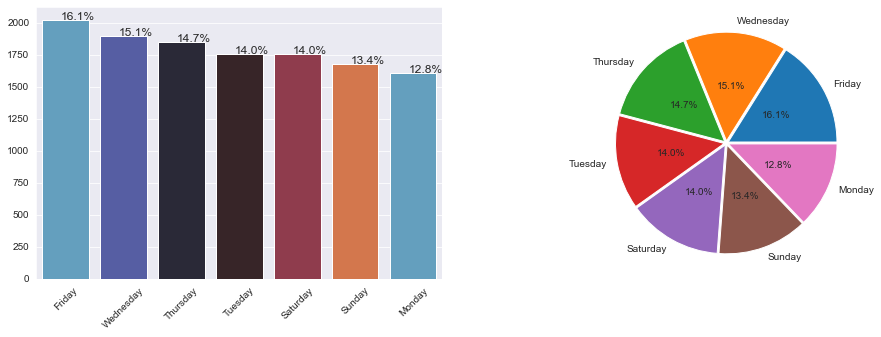

In [22]:
make_plots(temp.Day_of_Week.map(mapper))

Total unique values are:  24 


Category	Value



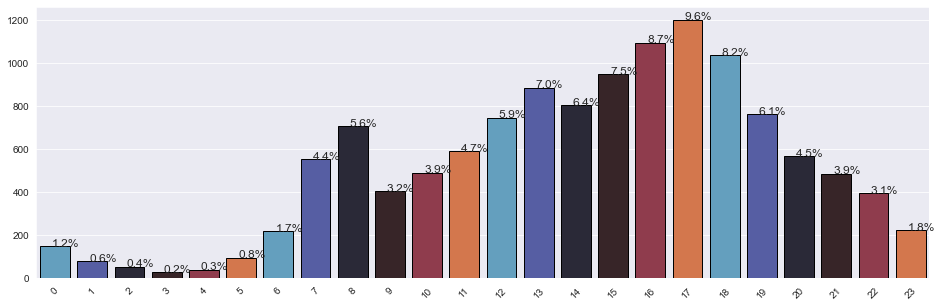

In [23]:
per_on_bar(temp.Hour, print_data=False)

From these two graphs I observed that there are no specific days and hours for the bikerson which accident occurs.

## c) For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

In [24]:
# Extracting Padesterian (HUMAN) data 
temp = df[((df["Pedestrian_Crossing-Human_Control"] != 0) | (df["Pedestrian_Crossing-Human_Control"] != -1))]

Total unique values are:  7 


Category	Value

Friday       31966
Thursday     29321
Wednesday    29097
Tuesday      28498
Saturday     27100
Monday       26904
Sunday       23235
Name: Day_of_Week, dtype: int64


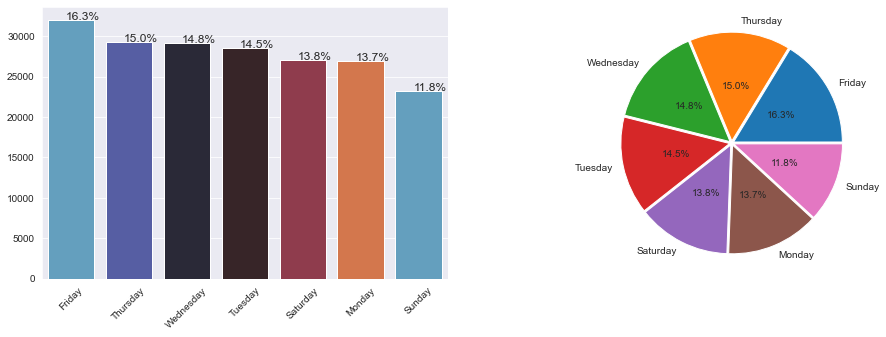

In [25]:
make_plots(temp.Day_of_Week.map(mapper))

Total unique values are:  24 


Category	Value



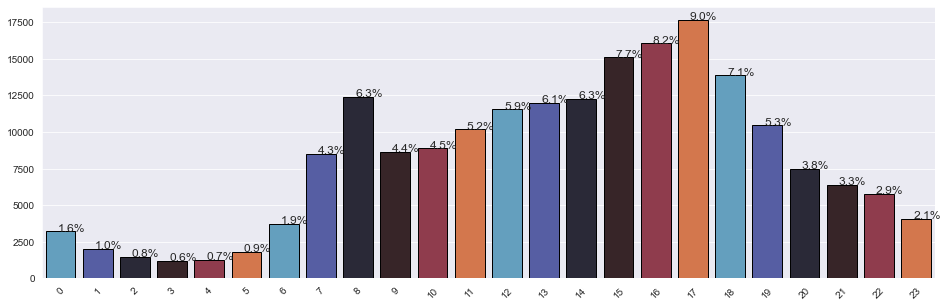

In [26]:
per_on_bar(temp.Hour, print_data=False)

In [27]:
# Extracting Padesterian (OTHER PHYSICAL) data 
temp = df[((df["Pedestrian_Crossing-Physical_Facilities"] != 0) | (df["Pedestrian_Crossing-Physical_Facilities"] != -1))]

Total unique values are:  7 


Category	Value

Friday       31966
Thursday     29321
Wednesday    29097
Tuesday      28498
Saturday     27100
Monday       26904
Sunday       23235
Name: Day_of_Week, dtype: int64


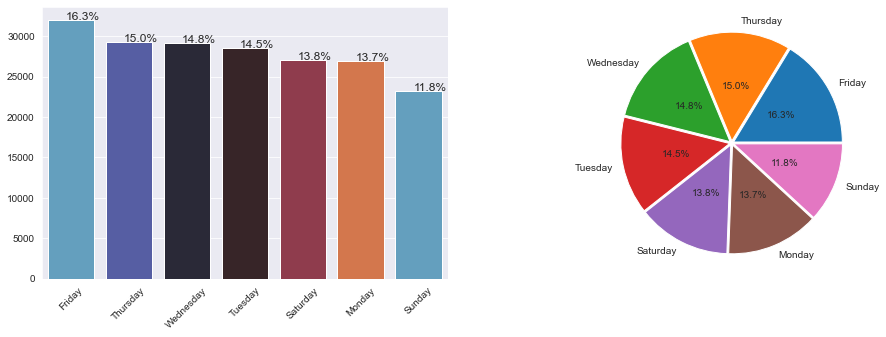

In [28]:
make_plots(temp.Day_of_Week.map(mapper))

Total unique values are:  24 


Category	Value



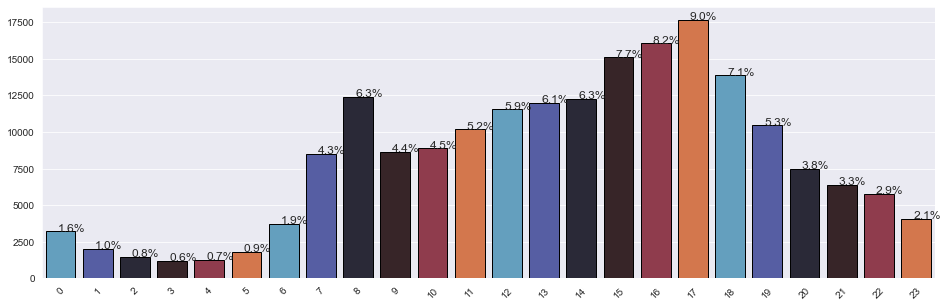

In [29]:
per_on_bar(temp.Hour, print_data=False)

## d) What impact, if any, does daylight savings have on road traffic accidents in the week after it starts and stops?

In [30]:
temp = df[(df.Light_Conditions == 1)]

In [31]:
px.histogram(temp.Day_of_Week.map(mapper))

No it does not have any impact on the weekends.

## e) What impact, if any, does sunrise and sunset times have on road traffic accidents?

In [32]:
temp = df[((df.Light_Conditions == 4) | (df.Light_Conditions == 5))]

In [33]:
px.histogram(temp.Hour, color=temp.Day_of_Week.map(mapper))

From this graph we can see that Yes the Sun rise have an impact on the ratio of accident specially at the end of day means in the evening. There are less number of accidents when the daylight is present like in hours from 7 to 15. But except this interval there are more number of accidents.

## f) Are there particular types of vehicles (engine capacity, age of vehicle, etc.) that are more frequently involved in road traffic accidents?

In [34]:
temp = df[((df.Vehicle_Type == 4) | (df.Vehicle_Type == 5))]

Total unique values are:  21 


Category	Value



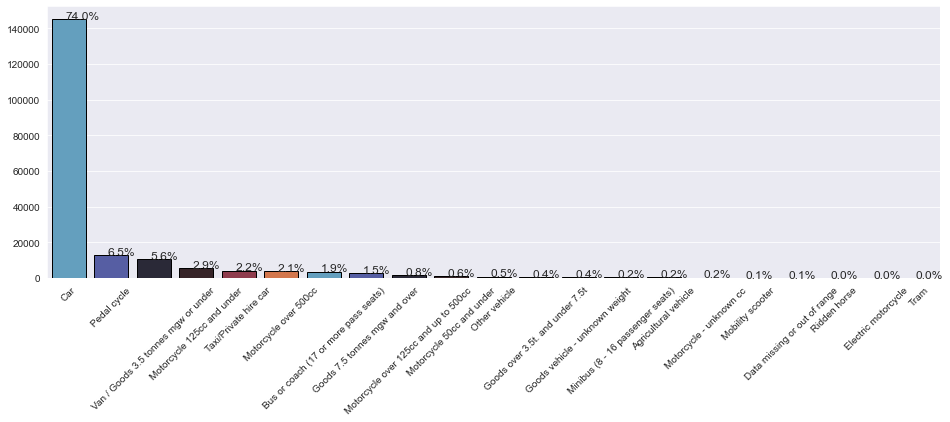

In [35]:
veh_mapper = {1: "Pedal cycle", 2: "Motorcycle 50cc and under",
                3: "Motorcycle 125cc and under",
                4: "Motorcycle over 125cc and up to 500cc",
                5: "Motorcycle over 500cc",
                8: "Taxi/Private hire car",
                9: "Car",
                10: "Minibus (8 - 16 passenger seats)",
                11: "Bus or coach (17 or more pass seats)",
                16: "Ridden horse",
                17: "Agricultural vehicle",
                18: "Tram",
                19: "Van / Goods 3.5 tonnes mgw or under",
                20: "Goods over 3.5t. and under 7.5t",
                21: "Goods 7.5 tonnes mgw and over",
                22: "Mobility scooter",
                23: "Electric motorcycle",
                90: "Other vehicle",
                97: "Motorcycle - unknown cc",
                98: "Goods vehicle - unknown weight",
                -1: "Data missing or out of range"
}

per_on_bar(df.Vehicle_Type.map(veh_mapper), print_data=False)

In [36]:
temp = df[df["Engine_Capacity_(CC)"] != -1].reset_index(drop=True)["Engine_Capacity_(CC)"].value_counts().sort_index()

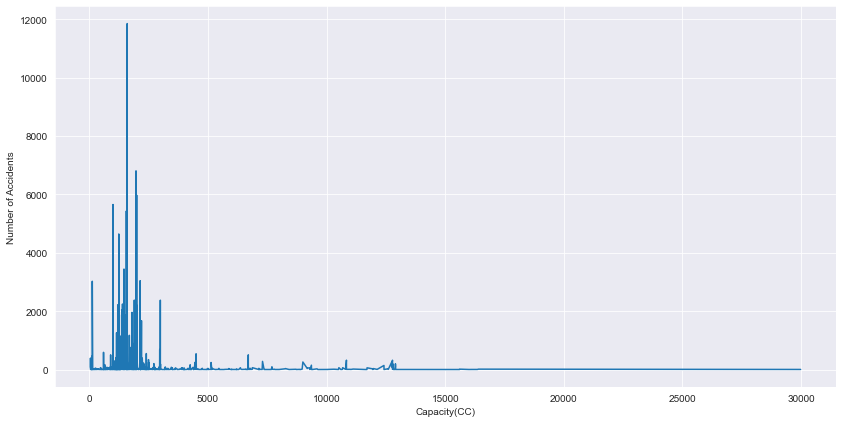

In [37]:
sns.lineplot(x=temp.index, y=temp.values)
plt.xlabel("Capacity(CC)")
plt.ylabel("Number of Accidents")
plt.show()

In [38]:
temp = df[df.Age_of_Vehicle != -1]

Total unique values are:  70 


Category	Value

3     11275
4     10816
1     10695
2     10588
5     10076
6      8856
12     8765
11     8078
7      7945
9      7914
8      7808
10     7621
13     7517
14     6491
15     5516
Name: Age_of_Vehicle, dtype: int64


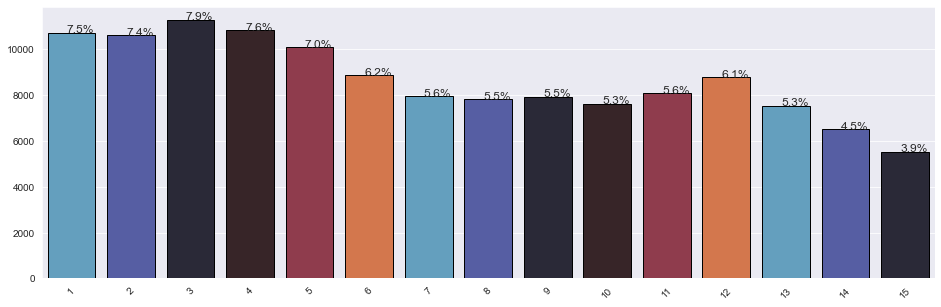

In [39]:
per_on_bar(temp.Age_of_Vehicle, limited=True, n=15)

From this graph we can see that Car and Pedal Cycle are mostly involved in Road Accidents.

From this graph we can see that most of the accidents are for the vehicles whose engine capacity is between 1 thousand to 3 thousands. Vehicles with high power have less number of accidents.

Vehicels that are 3 and 4 years old have more accidents.

## g) Are there particular conditions (weather, geographic location, situations) that generate more road traffic accidents?

In [40]:
temp = df[((df.Weather_Conditions != -1) | (df.Weather_Conditions != 9))]

Total unique values are:  8 


Category	Value

Fine no high winds       157914
Raining no high winds     23622
Other                      4542
Fine + high winds          2177
Raining + high winds       2085
Fog or mist                 594
Snowing no high winds       549
Snowing + high winds         69
Name: Weather_Conditions, dtype: int64


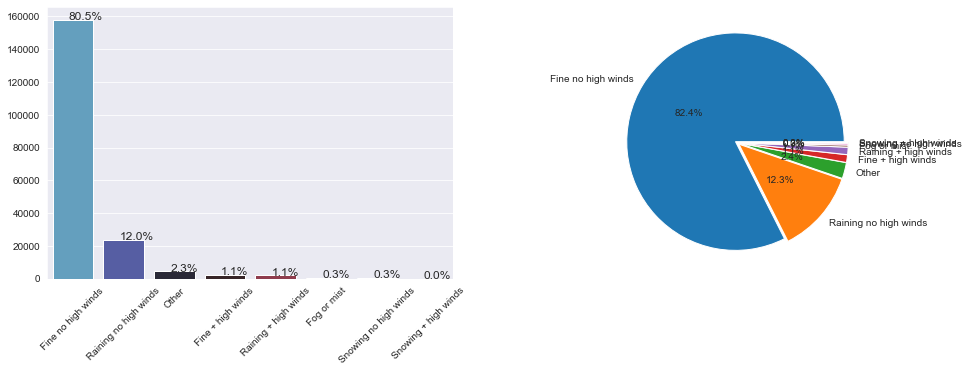

In [41]:
weth_mapper = {
    1: "Fine no high winds",
    2: "Raining no high winds",
    3: "Snowing no high winds",
    4: "Fine + high winds",
    5: "Raining + high winds",
    6: "Snowing + high winds",
    7: "Fog or mist",
    8: "Other"
}

make_plots(temp.Weather_Conditions.map(weth_mapper))

Total unique values are:  7 


Category	Value

Dry                     157914
Wet or damp              23622
Frost or ice              2177
Flood over 3cm. deep      2085
Mud                        594
Snow                       549
Oil or diesel               69
Name: Weather_Conditions, dtype: int64


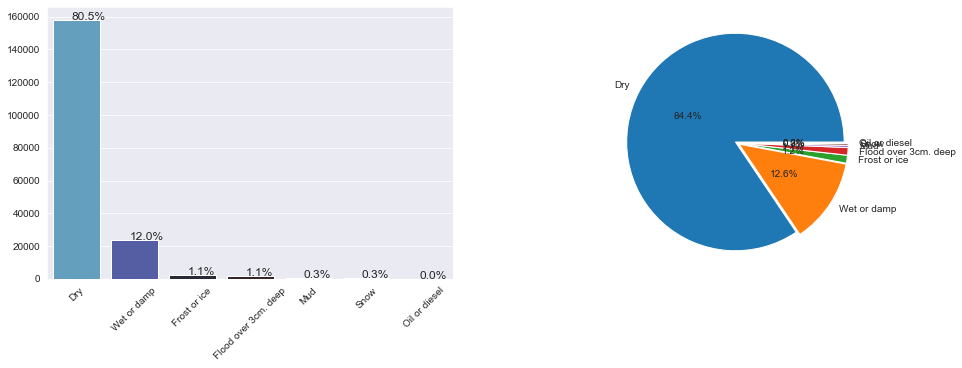

In [42]:
roa_mapper = {
    1: "Dry",
    2: "Wet or damp",
    3: "Snow",
    4: "Frost or ice",
    5: "Flood over 3cm. deep",
    6: "Oil or diesel",
    7: "Mud",
    -1: "Data missing or out of range"
}

make_plots(df.Weather_Conditions.map(roa_mapper))

In [43]:
temp = df.sample(1000)
fig = px.scatter_geo(temp,lat='Latitude',lon='Longitude', scope="europe", hover_name="Accident_Index")
fig.update_layout(title = 'World map', title_x=0.5)
fig.show()

In [44]:
level3 = df[df['Accident_Severity'] == 3]
level2 = df[df['Accident_Severity'] == 2]
level1 = df[df['Accident_Severity'] == 1]

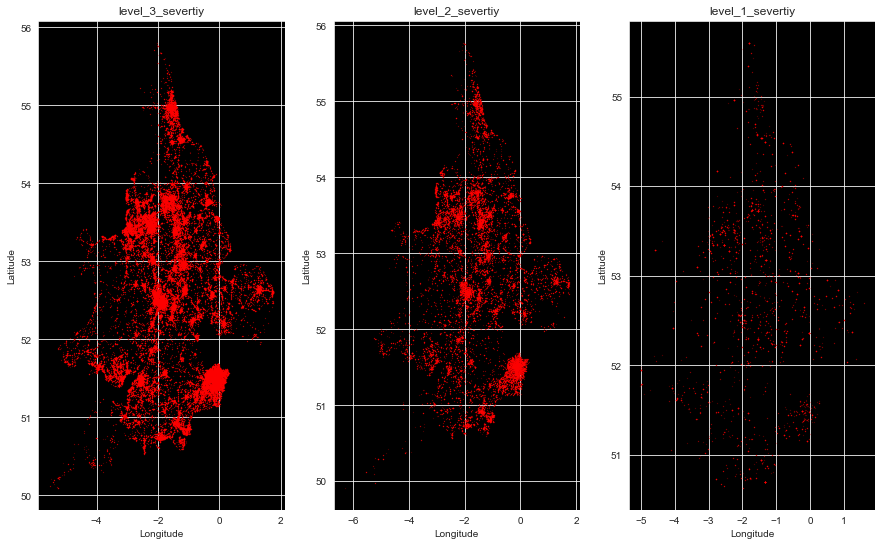

In [45]:
f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,9))

## level 3 plot
level3.plot(kind='scatter', x='Longitude',y ='Latitude',
                color='red', 
                s=.03, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("level_3_severtiy")
ax1.set_facecolor('black')

## level 2 plot
level2.plot(kind='scatter', x='Longitude',y ='Latitude',
                color='red', 
                s=.03, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("level_2_severtiy")
ax2.set_facecolor('black')

# level 1 plot

level1.plot(kind='scatter', x='Longitude',y ='Latitude',
                color='red', 
                s=.04, alpha=.6, subplots=True, ax=ax3)
ax3.set_title("level_1_severtiy")
ax3.set_facecolor('black')

f.show()

After Fine weather the accidants are high for Raning Environment.

Wet and Damp road has more number of accidants after Dry road.

There are some specif areas where accidents are higher like at Latitude=51.4

## h) How does driver related variables affect the outcome (e.g., age of the driver, and the purpose of the journey)?

In [46]:
temp = df[df["Age_of_Driver"] != -1].reset_index(drop=True)["Age_of_Driver"].value_counts().sort_index()

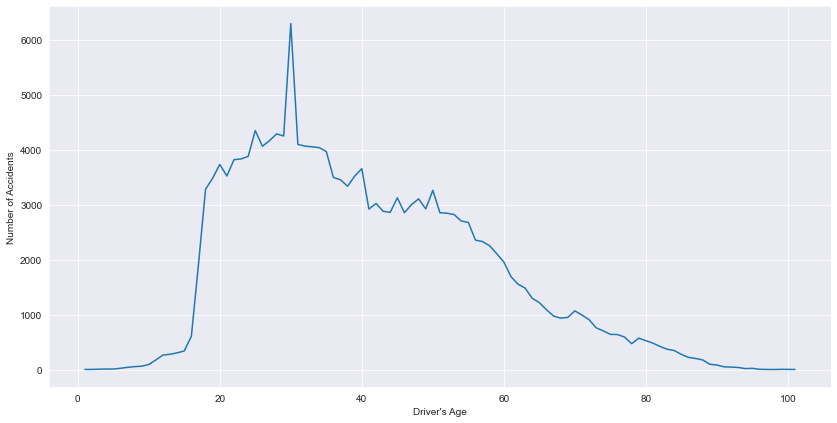

In [47]:
sns.lineplot(x=temp.index, y=temp.values)
plt.xlabel("Driver's Age")
plt.ylabel("Number of Accidents")
plt.show()

Drivers with age from 30 to 35 become the cause of more accidants

Total unique values are:  7 


Category	Value

Oil or diesel                   124467
Dry                              27577
Flood over 3cm. deep             21450
Wet or damp                      19786
Snow                              2185
Frost or ice                       635
Data missing or out of range        21
Name: Journey_Purpose_of_Driver, dtype: int64


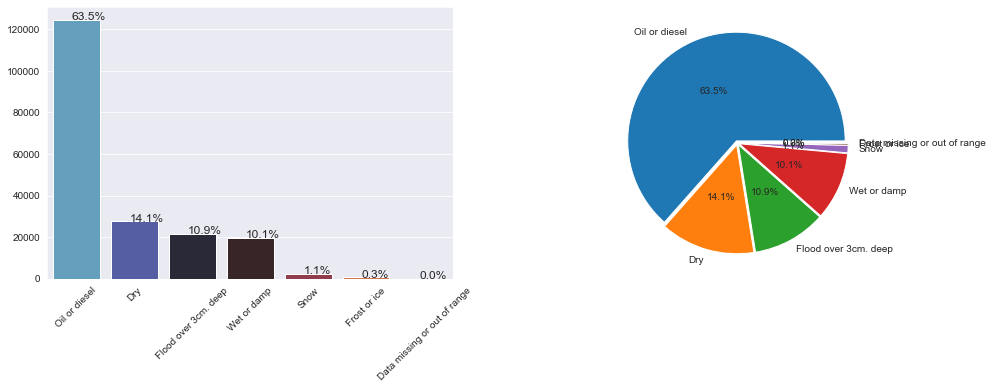

In [48]:
purp_mapper = {
    1: "Journey as part of work",
    2: "Commuting to/from work",
    3: "Taking pupil to/from school",
    4: "Pupil riding to/from school",
    5: "Other",
    6: "Not known",
    15: "Other/Not known (2005-10)",
    -1: "Data missing or out of range"
}

make_plots(df.Journey_Purpose_of_Driver.map(roa_mapper))

In [49]:
highway_to_hell = df[df['Local_Authority_(District)'] == 300]['Local_Authority_(Highway)'].unique()
print("London's most dangerous highway is {}".format(highway_to_hell[0]))

London's most dangerous highway is E08000025


## i) Can we make predictions about when and where accidents will occur, and the severity of the injuries sustained from the data supplied to improve road safety? How well do our models compare to government models?

In [50]:
data = df.copy()

In [51]:
cols = ["Accident_Index", "Longitude", "Latitude", "Date", "Time", "Local_Authority_(Highway)"]
df.drop(cols, axis=1, inplace=True)

#### WHEN

In [52]:
X = df.drop(["Hour", "LSOA_of_Accident_Location"], axis=1)
y = df.Hour

In [53]:
from sklearn.decomposition import PCA
composer = PCA(5)
X = composer.fit_transform(X)

In [54]:
from sklearn.tree import DecisionTreeClassifier
model_when = DecisionTreeClassifier()
model_when.fit(X, y)

DecisionTreeClassifier()

In [55]:
model_when.predict(X[0].reshape((1, -1)))[0]

17

#### WHERE

In [56]:
df = data.copy()

In [57]:
cols = ["Accident_Index", "Date", "Time", "LSOA_of_Accident_Location", "Local_Authority_(Highway)"]
df.drop(cols, axis=1, inplace=True)

In [58]:
X = df.drop(["Latitude"], axis=1)
y = df.Latitude

In [59]:
composer = PCA(2)
X = composer.fit_transform(X)

In [60]:
from sklearn.tree import DecisionTreeRegressor
model_where = DecisionTreeRegressor()
model_where.fit(X, y)

DecisionTreeRegressor()

In [61]:
model_where.predict(X[0].reshape((1, -1)))[0]

51.508057

In [62]:
X = df.drop(["Longitude"], axis=1)
y = df.Longitude

composer = PCA(2)
X = composer.fit_transform(X)

model_where = DecisionTreeRegressor()
model_where.fit(X, y)

model_where.predict(X[0].reshape((1, -1)))[0]

-0.153842

#### SEVERITY

In [63]:
df = data.copy()

cols = ["Accident_Index", "Date", "Time", "LSOA_of_Accident_Location", "Local_Authority_(Highway)"]
df.drop(cols, axis=1, inplace=True)

In [64]:
X = df.drop(["Accident_Severity", "Latitude", "Longitude"], axis=1)
y = df.Accident_Severity

In [65]:
composer = PCA(3)
X = composer.fit_transform(X)

In [66]:
model_severe = DecisionTreeClassifier()
model_severe.fit(X, y)

DecisionTreeClassifier()

In [67]:
model_severe.predict(X[0].reshape((1, -1)))[0]

3